In [1]:
%run "part01_preprocessing.ipynb"

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

# Content   
   
**Data Preparation**
- Lidando com Outliers - Isolation Forest
- Normalização
- Padronização
- Redução de Dimensionalidade 
 - PCA
 - UMAP
 - t-SNE

**Machine Learning**
- Kmeans
- Hieracical Cluster
- Gausian Mistured Model

**Conclusão**

# Data Preparation

## Lidando com Outliers - Isolation Forest

In [2]:
data_noutliers = data_new.copy()

In [4]:
# Arbitariamente assumindo que 0.01% do dataset são outliers o que corresponde aproximadamente no máximo 90 amostras
isfo = IsolationForest(contamination=0.01, random_state = RANDOM_SEED)#, max_samples = 100, )
isfo.fit(data_noutliers[numerical_features])

C:\Users\Alysson\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



IsolationForest(contamination=0.01, random_state=42)

In [5]:
data_noutliers['anomaly_score'] =  isfo.decision_function(data_noutliers[numerical_features])
data_noutliers['anomaly'] = isfo.predict(data_noutliers[numerical_features])

In [6]:
print("Number of rows with outliers:", data_noutliers[data_noutliers['anomaly'] == -1].shape[0])
print("Number of rows without outliers", data_noutliers[data_noutliers['anomaly'] == 1].shape[0])
print("Number of original rows:", data_new.shape[0])

Number of rows with outliers: 90
Number of rows without outliers 8860
Number of original rows: 8950


In [7]:
data_noutliers['anomaly'].value_counts(normalize=True)

 1    0.989944
-1    0.010056
Name: anomaly, dtype: float64

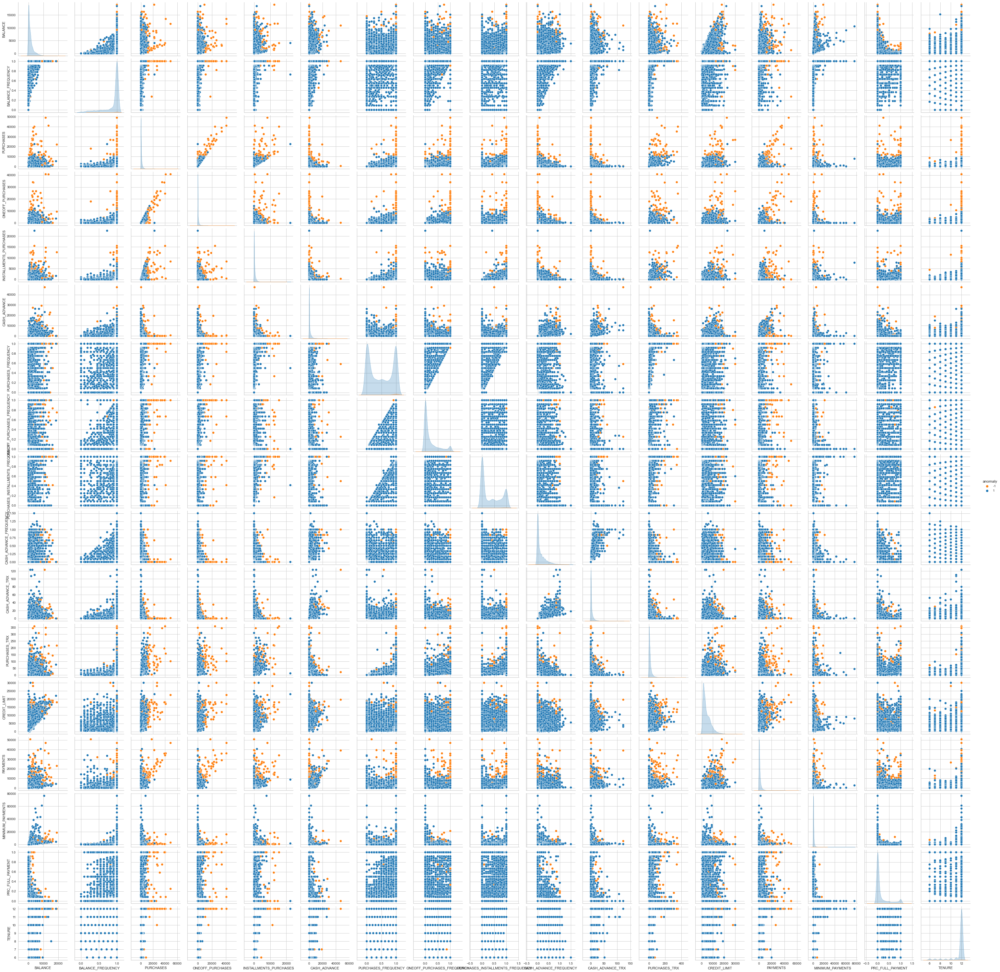

In [77]:
palette = ['#ff7f0e','#1f77b4']
sns.pairplot(data_noutliers, vars=numerical_features, hue='anomaly', palette=palette)

In [9]:
data_prep = data_noutliers.loc[data_noutliers['anomaly']==1]

In [10]:
data_prep = data_prep.drop(columns=['anomaly','anomaly_score'], axis=1)

In [11]:
data_prep

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PROFIT,LIMIT_EXCEED
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,106.402084,0
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,4103.032597,0
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,-151.103258,0
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,-1499.000000,0
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,662.334763,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,34.474462,0
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,-24.138678,0
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,-63.129225,0
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,52.549959,0


## Normalização

In [12]:
#data_prep=data_new.copy() Testing without isolation forest

In [13]:
log_columns = data_prep.drop('PROFIT',axis=1).skew().sort_values(ascending=False) #PROFIT possui zeros não podemos aplicar log
log_columns = log_columns.loc[log_columns > 0.75]
log_columns

MINIMUM_PAYMENTS              14.379889
INSTALLMENTS_PURCHASES         6.513429
CASH_ADVANCE_TRX               5.585919
PAYMENTS                       4.784280
LIMIT_EXCEED                   4.375917
ONEOFF_PURCHASES               4.046439
PURCHASES_TRX                  3.990547
CASH_ADVANCE                   3.885995
PURCHASES                      3.402333
BALANCE                        2.260337
PRC_FULL_PAYMENT               1.962302
CASH_ADVANCE_FREQUENCY         1.824329
ONEOFF_PURCHASES_FREQUENCY     1.575175
CREDIT_LIMIT                   1.469088
dtype: float64

In [14]:
for col in log_columns.index:
    data_prep[col] = np.log1p(data_prep[col])

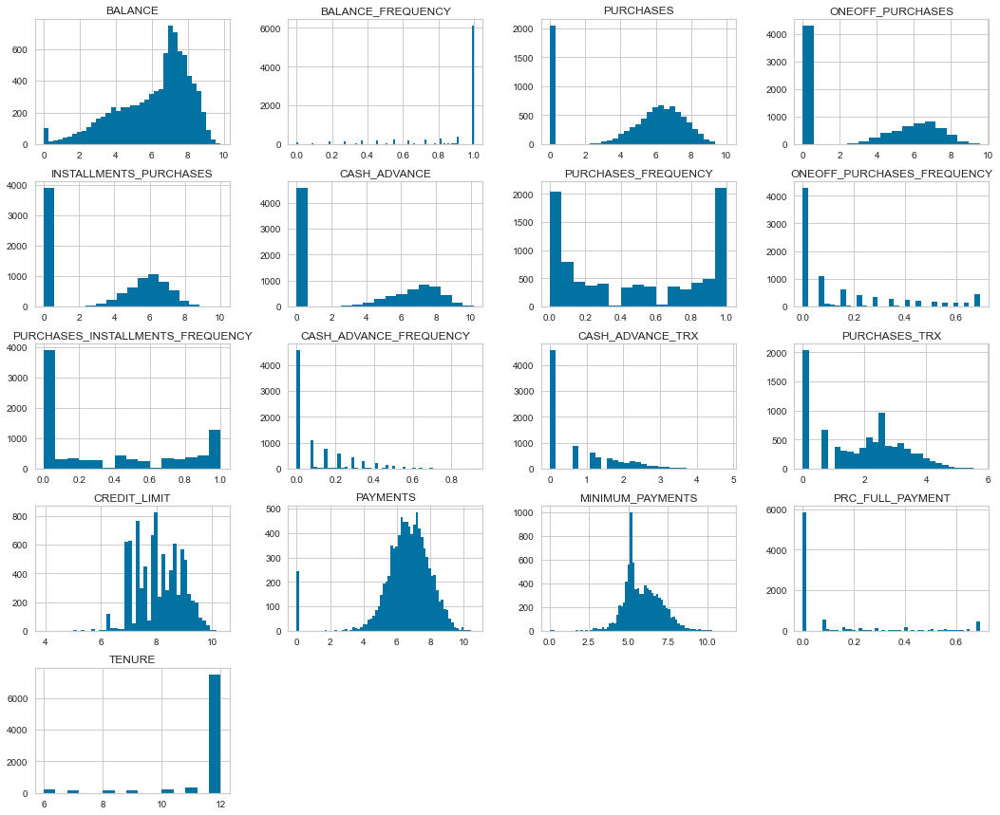

In [15]:
data_prep[numerical_features].hist(figsize=(18,15), bins='auto');

## Padronização

In [16]:
mms = MinMaxScaler()

for col in data_prep[numerical_features]:
    data_prep[col] = mms.fit_transform(data_prep[[col]]).squeeze()

In [17]:
data_prep.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PROFIT,LIMIT_EXCEED
0,C10001,0.380170,0.818182,0.455879,0.000000,0.455879,0.000000,0.166667,0.000000,0.083333,0.000000,0.000000,0.191510,0.466811,0.500576,0.438874,0.000000,1.0,106.402084,0.0
1,C10002,0.821548,0.909091,0.000000,0.000000,0.000000,0.861905,0.000000,0.000000,0.000000,0.243529,0.333889,0.000000,0.771814,0.783975,0.620013,0.289506,1.0,4103.032597,0.0
2,C10003,0.796156,1.000000,0.663764,0.695640,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.447122,0.782631,0.606343,0.572303,0.000000,1.0,-151.103258,0.0
3,C10004,0.755107,0.636364,0.729767,0.764811,0.000000,0.523939,0.083333,0.115477,0.000000,0.087355,0.143798,0.120830,0.782631,0.000000,0.527702,0.000000,1.0,-1499.000000,0.0
4,C10005,0.682698,1.000000,0.282719,0.296295,0.000000,0.000000,0.083333,0.115477,0.000000,0.000000,0.000000,0.120830,0.495375,0.614491,0.488693,0.000000,1.0,662.334763,0.0


## Redução de Dimensionalidade - PCA

In [18]:
# Checking All components first
pca = PCA(n_components=data_prep[numerical_features].shape[1], random_state=RANDOM_SEED)
components = pca.fit_transform(data_prep[numerical_features])
components.shape

(8860, 17)

In [19]:
data_prep.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
PROFIT                              0
LIMIT_EXCEED                        0
dtype: int64

In [20]:
nfeatures = range(pca.n_components_)
nfeatures

range(0, 17)

In [21]:
pca.explained_variance_ratio_

array([0.45885617, 0.16337499, 0.13382215, 0.06430319, 0.04755228,
       0.03714879, 0.02437233, 0.01499395, 0.01151517, 0.01056119,
       0.00945589, 0.00869105, 0.00686395, 0.00296263, 0.00218091,
       0.00202973, 0.00131562])

In [22]:
data_prep[numerical_features].var().sort_values(ascending=False)

PURCHASES_FREQUENCY                 0.160548
PURCHASES_INSTALLMENTS_FREQUENCY    0.156889
CASH_ADVANCE                        0.122102
ONEOFF_PURCHASES                    0.113047
ONEOFF_PURCHASES_FREQUENCY          0.095014
INSTALLMENTS_PURCHASES              0.093458
PRC_FULL_PAYMENT                    0.092250
PURCHASES                           0.083611
BALANCE_FREQUENCY                   0.056488
PURCHASES_TRX                       0.055729
TENURE                              0.049965
CASH_ADVANCE_TRX                    0.043074
BALANCE                             0.041811
CASH_ADVANCE_FREQUENCY              0.028662
PAYMENTS                            0.021889
CREDIT_LIMIT                        0.016223
MINIMUM_PAYMENTS                    0.011119
dtype: float64

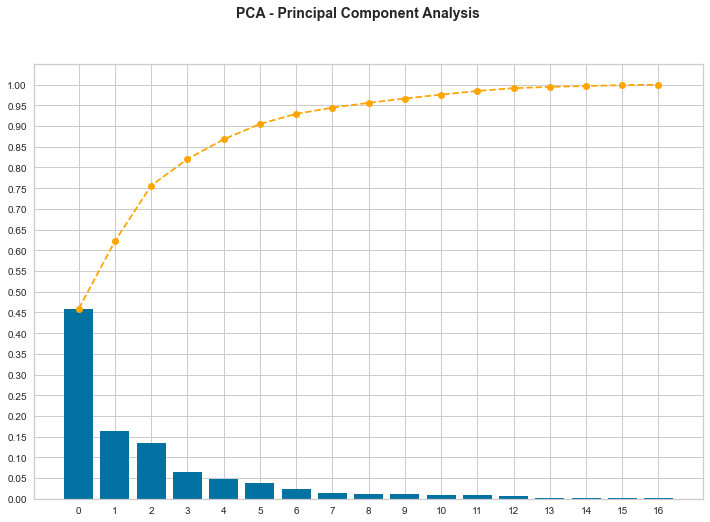

In [23]:
plt.figure(figsize=(12,8))
plt.suptitle('PCA - Principal Component Analysis', fontsize=14, fontweight='bold')
plt.bar(nfeatures, pca.explained_variance_ratio_)
plt.plot(nfeatures, pca.explained_variance_ratio_.cumsum(),color='orange', linestyle='--',marker='o' )
#plt.axhline(.95)
plt.yticks(np.arange(0,1.05,0.05))
plt.xticks(np.arange(0,pca.n_components_,1))
plt.show()

In [24]:
# With 9 components we have 96% of variance explanation
pca = PCA(9, random_state=RANDOM_SEED)
components = pca.fit_transform(data_prep[numerical_features])

In [25]:
components.shape

(8860, 9)

## Redução de Dimensionalidade -  UMAP

In [26]:
clusters = data_prep.copy()

In [27]:
data_prep

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PROFIT,LIMIT_EXCEED
0,C10001,0.380170,0.818182,0.455879,0.000000,0.455879,0.000000,0.166667,0.000000,0.083333,0.000000,0.000000,0.191510,0.466811,0.500576,0.438874,0.000000,1.0,106.402084,0.0
1,C10002,0.821548,0.909091,0.000000,0.000000,0.000000,0.861905,0.000000,0.000000,0.000000,0.243529,0.333889,0.000000,0.771814,0.783975,0.620013,0.289506,1.0,4103.032597,0.0
2,C10003,0.796156,1.000000,0.663764,0.695640,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.447122,0.782631,0.606343,0.572303,0.000000,1.0,-151.103258,0.0
3,C10004,0.755107,0.636364,0.729767,0.764811,0.000000,0.523939,0.083333,0.115477,0.000000,0.087355,0.143798,0.120830,0.782631,0.000000,0.527702,0.000000,1.0,-1499.000000,0.0
4,C10005,0.682698,1.000000,0.282719,0.296295,0.000000,0.000000,0.083333,0.115477,0.000000,0.000000,0.000000,0.120830,0.495375,0.614491,0.488693,0.000000,1.0,662.334763,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,0.344433,1.000000,0.566509,0.000000,0.566509,0.000000,1.000000,0.000000,0.833333,0.000000,0.000000,0.339211,0.466811,0.545476,0.346621,0.584963,0.0,34.474462,0.0
8946,C19187,0.305827,1.000000,0.569497,0.000000,0.569497,0.000000,1.000000,0.000000,0.833333,0.000000,0.000000,0.339211,0.466811,0.529909,0.448794,0.000000,0.0,-24.138678,0.0
8947,C19188,0.325132,0.833333,0.496890,0.000000,0.496890,0.000000,0.833333,0.000000,0.666667,0.000000,0.000000,0.312340,0.466811,0.415560,0.392423,0.321928,0.0,-63.129225,0.0
8948,C19189,0.271870,0.833333,0.000000,0.000000,0.000000,0.356313,0.000000,0.000000,0.000000,0.168234,0.227915,0.000000,0.358276,0.375097,0.358114,0.321928,0.0,52.549959,0.0


In [28]:
# Dimensionality Reduction(to 2D) using technique UMAP 
umap = UMAP(random_state=RANDOM_SEED)
umap_embedding = umap.fit_transform(components)

# X,y axis representation for UMAP
clusters['umap_x'] = umap_embedding[:,0]
clusters['umap_y'] = umap_embedding[:,1]

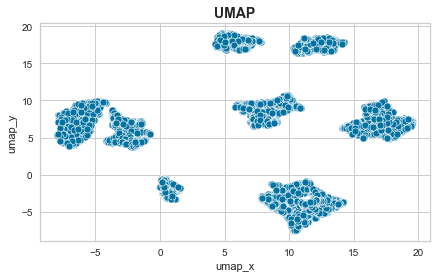

In [29]:
plt.figure(figsize=(7,4))
plt.title('UMAP', fontsize='14',fontweight='bold')
sns.scatterplot(data=clusters, x='umap_x', y='umap_y');

## Redução de Dimensionalidade -  t-SNE

In [30]:
# Dimensionality Reduction(to 2D) using technique TSNE
tsne = TSNE(n_components=2, init='pca', learning_rate='auto', n_jobs=-1, random_state=RANDOM_SEED)
tsne_embedding = tsne.fit_transform(components)

# X,y axis representation using TSNE
clusters['tsne_x'] = tsne_embedding[:,0]
clusters['tsne_y'] = tsne_embedding[:,1]

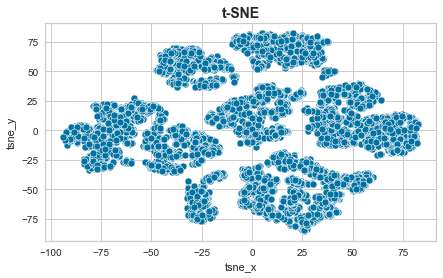

In [31]:
plt.figure(figsize=(7,4))
plt.title('t-SNE', fontsize='14',fontweight='bold')
sns.scatterplot(data=clusters, x='tsne_x', y='tsne_y');

In [32]:
# Setting 2D plot parameters for Plotly
temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12)))

def plot_graph2D(x,y, cluster, title):    
    name=cluster.name
    #data=data.sort_values(by=cluster.name, ascending=True)
    cluster=cluster.astype(str)
    
    fig = px.scatter(#data, 
                     x=x, 
                     y=y, 
                     color=cluster, 
                     color_discrete_sequence=px.colors.qualitative.Prism
                    )

    fig.update_traces(marker=dict(size=11, 
                              opacity=0.75, 
                              line=dict(width=1, color='#F7F7F7')))

    fig.update_layout(template=temp, 
                  title=title, 
                  width=700, 
                  legend_title='Clusters',                  
                  xaxis=dict(title='x', showline=True, zeroline=False), 
                  yaxis=dict(title='y',showline=True, zeroline=False))    
    
    fig.show()

# Machine Learning

## KMEANS

In [33]:
# Finding best K param to Kmeans, using WCSS and Silhouette Score as metrics
kmeans_scores_list = []

for k in range(2,10):
    tunning_kmeans = KMeans(n_clusters=k, random_state=RANDOM_SEED)# init="k-means++",
    # We need to test which space (PCA, UMAP, t-SNE) performs best according to WCSS and Silhouette Score metrics
    # component, umap_embedding, tsne_embedding
    # Thus, the space embedding that presented the best results was the UMAP.
    tunning_kmeans_labels = tunning_kmeans.fit_predict(umap_embedding)
    
    ss = silhouette_score(umap_embedding, tunning_kmeans_labels, metric='euclidean')
    
    dbs = davies_bouldin_score(umap_embedding, tunning_kmeans_labels)
    
    kmeans_scores_list.append(pd.Series({'Clusters': k,
                                    'WCSS': tunning_kmeans.inertia_,
                                    'SS': ss,
                                    'Davies Bouldin Score': dbs}))

In [34]:
kmeans_scores_table = (pd.concat(kmeans_scores_list, axis=1).T[['Clusters','WCSS','SS','Davies Bouldin Score']].set_index('Clusters'))
kmeans_scores_table

,WCSS,SS,Davies Bouldin Score
Clusters,,,
2.0,578246.125000,0.447199,1.101118
3.0,272447.312500,0.561689,0.601159
4.0,144420.703125,0.622602,0.615760
5.0,91665.257812,0.664558,0.455569
6.0,54388.070312,0.691296,0.411947
7.0,35559.558594,0.728209,0.340273
8.0,27198.050781,0.695523,0.445715
9.0,23177.443359,0.632257,0.591872


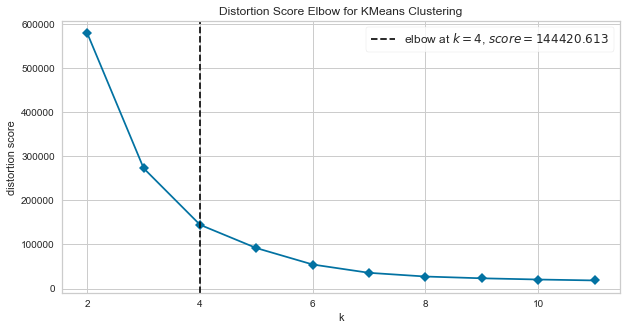

In [35]:
plt.figure(figsize=(10,5))
elbow = KElbowVisualizer(tunning_kmeans, k=(2,12), timings = False)
elbow.fit(umap_embedding)
elbow.show();

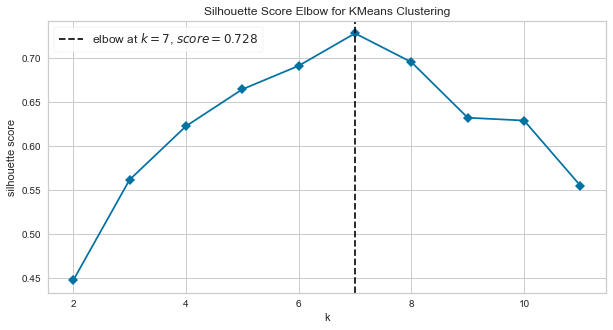

In [36]:
plt.figure(figsize=(10,5))
ss = KElbowVisualizer(tunning_kmeans, k=(2,12), metric = 'silhouette', timings = False)
ss.fit(umap_embedding)
ss.show();

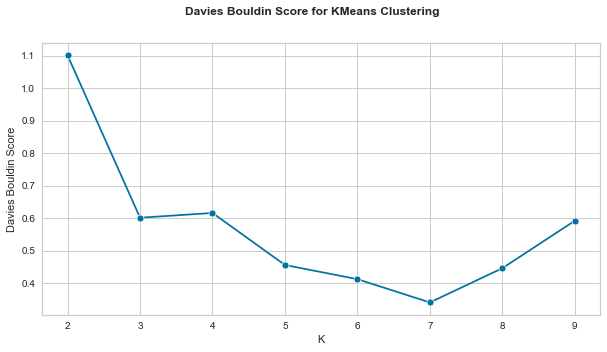

In [37]:
plt.figure(figsize=(10,5))
plt.suptitle('Davies Bouldin Score for KMeans Clustering', fontsize=12, fontweight='bold')
sns.lineplot(x=kmeans_scores_table.index, y=kmeans_scores_table['Davies Bouldin Score'], marker='o')
plt.xlabel('K');
plt.ylabel('Davies Bouldin Score');

In [38]:
# Using the best k find to our purpouse
k=7
kmeans = KMeans( n_clusters=k, random_state=RANDOM_SEED)#init = "k-means++",
kmeans_labels = kmeans.fit_predict(umap_embedding)
clusters['KMeans'] = kmeans_labels

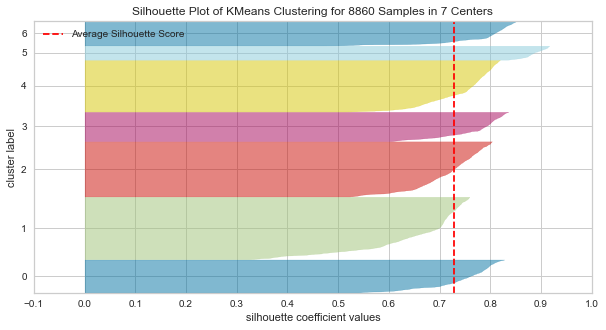

In [39]:
plt.figure(figsize=(10,5))
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(umap_embedding)
visualizer.finalize()

In [40]:
clusters.sort_values(by='KMeans')
plot_graph2D(clusters['umap_x'],
             clusters['umap_y'],
             clusters['KMeans'],
             title='KMeans Cluster using UMAP')

## Hierarchical Clustering

In [42]:
hc_scores_list = []

for k in range(2,11):
    tunning_hc = hierarchy.linkage(umap_embedding, 'ward', metric='euclidean')# init="k-means++",
    
    # We need to test which space (PCA, UMAP, t-SNE) performs best according to WCSS and Silhouette Score metrics
    # component, umap_embedding, tsne_embedding
    # Thus, the space embedding that presented the best results was the UMAP.
    tunning_hc_labels = hierarchy.fcluster(tunning_hc, k, criterion='maxclust')
    
    ss = silhouette_score(umap_embedding, tunning_hc_labels, metric='euclidean')
    
    dbs = davies_bouldin_score(umap_embedding, tunning_hc_labels)
    
    hc_scores_list.append(pd.Series({'Clusters': k,
                                    'SS': ss,
                                    'Davies Bouldin Score': dbs}))

In [43]:
hc_scores_table = (pd.concat(hc_scores_list, axis=1).T[['Clusters','SS','Davies Bouldin Score']].set_index('Clusters'))

In [44]:
hc_scores_table

,SS,Davies Bouldin Score
Clusters,,
2.0,0.447199,1.101118
3.0,0.561848,0.601454
4.0,0.622961,0.615545
5.0,0.664941,0.455822
6.0,0.691296,0.411947
7.0,0.728209,0.340273
8.0,0.695526,0.445791
9.0,0.628170,0.605552
10.0,0.621952,0.601081


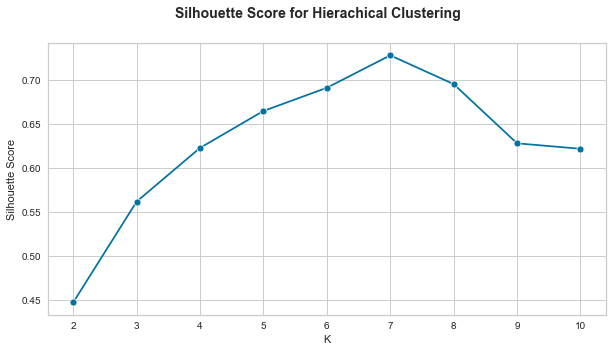

In [45]:
plt.figure(figsize=(10,5))
plt.suptitle('Silhouette Score for Hierachical Clustering', fontsize=14, fontweight='bold')
sns.lineplot(x=hc_scores_table.index, y=hc_scores_table['SS'], marker='o')
plt.xlabel('K');
plt.ylabel('Silhouette Score');

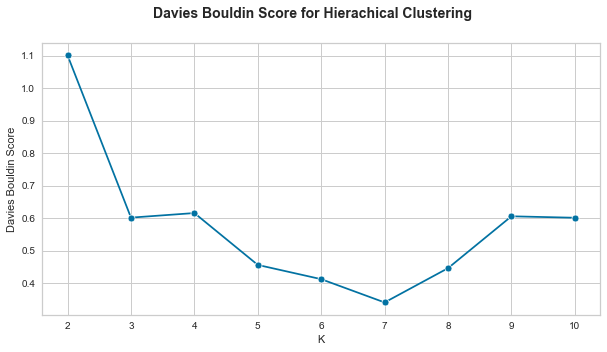

In [46]:
plt.figure(figsize=(10,5))
plt.suptitle('Davies Bouldin Score for Hierachical Clustering', fontsize=14, fontweight='bold')
sns.lineplot(x=hc_scores_table.index, y=hc_scores_table['Davies Bouldin Score'], marker='o')
plt.xlabel('K');
plt.ylabel('Davies Bouldin Score');

C:\Users\Alysson\AppData\Local\Temp/ipykernel_7656/1047813183.py:20: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



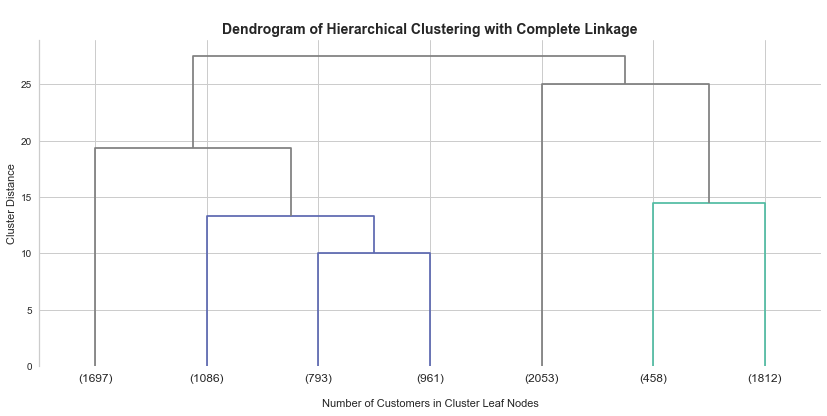

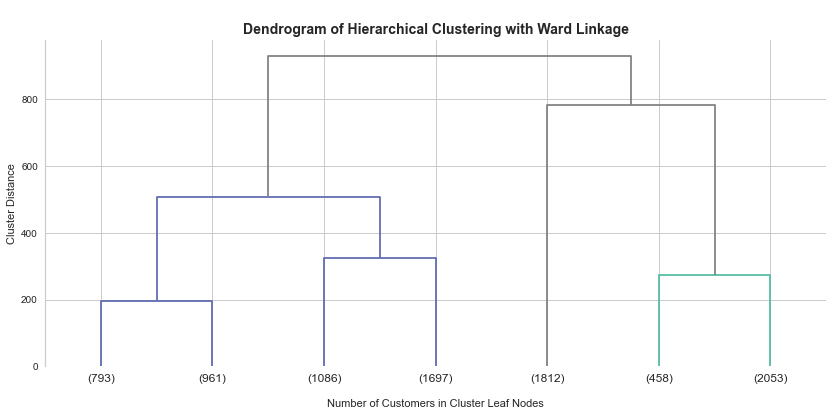

In [47]:
methods=['complete','ward']

for i in methods:
    Z = hierarchy.linkage(umap_embedding, method=i, metric='euclidean')
    hierarchy.set_link_color_palette(['#5d69b1', '#52bca3', '#99c945'])

    fig, ax = plt.subplots(figsize=(14,6))
    den=hierarchy.dendrogram(Z, 
                             p=7, 
                             truncate_mode='lastp',
                             show_leaf_counts=True, 
                             ax=ax,
                             above_threshold_color='grey') #orientation='top', #color_threshold=100,
    
    #ax.axhline(10, color='grey', linestyle='--')
    ax.set_title(f'\nDendrogram of Hierarchical Clustering with {i.capitalize()} Linkage', fontweight='bold', fontsize='14')
    ax.set_xlabel('\nNumber of Customers in Cluster Leaf Nodes')
    ax.set_ylabel('Cluster Distance')
    ax.spines['right'].set_visible(False), ax.spines['top'].set_visible(False), ax.spines['bottom'].set_visible(False)
    fig.show()

In [48]:
k=7
#hc = AgglomerativeClustering(k, affinity='euclidean', linkage='complete', compute_full_tree=False)
hc = hierarchy.linkage(umap_embedding, 'ward', metric='euclidean')
hc_labels = hierarchy.fcluster(hc, k, criterion='maxclust')
clusters["HierarchicalCluster"]=hc_labels

In [49]:
plot_graph2D(clusters['umap_x'],
             clusters['umap_y'],
             clusters['HierarchicalCluster'],
             title='Hierarchical Cluster using UMAP')

## Gausian Mistured Model

In [50]:
# Finding best K param to GMM, AIC and BIC as metrics
gmm_scores_list = []

for k in range(2,13):
    tunning_gmm = GaussianMixture(n_components=k, random_state=RANDOM_SEED)#n_init=5, init_params='k-means++', 
    tunning_gmm_labels = tunning_gmm.fit_predict(umap_embedding)
    
    
    ss = silhouette_score(umap_embedding, tunning_gmm_labels, metric='euclidean')
    dbs = davies_bouldin_score(umap_embedding, tunning_gmm_labels)
    
    gmm_scores_list.append(pd.Series({'Clusters': k,
                                    'AIC': tunning_gmm.aic(umap_embedding),
                                    'BIC': tunning_gmm.bic(umap_embedding),
                                    'SS': ss,
                                    'Davies Bouldin Score': dbs}))
    
gmm_scores_table = (pd.concat(gmm_scores_list, axis=1).T[['Clusters','AIC','BIC','SS','Davies Bouldin Score']]).set_index('Clusters')

In [51]:
gmm_scores_table

,AIC,BIC,SS,Davies Bouldin Score
Clusters,,,,
2.0,117641.201564,117719.183887,0.360309,0.966000
3.0,108394.880440,108515.398574,0.561848,0.601454
4.0,99867.882422,100030.936369,0.622961,0.615545
5.0,96416.373851,96621.963611,0.664941,0.455822
6.0,93052.898616,93301.024187,0.691296,0.411947
7.0,90921.809545,91212.470928,0.728209,0.340273
8.0,90468.547371,90801.744567,0.650997,0.578235
9.0,89953.111717,90328.844726,0.670306,0.487626
10.0,88529.321926,88947.590747,0.636852,0.554841


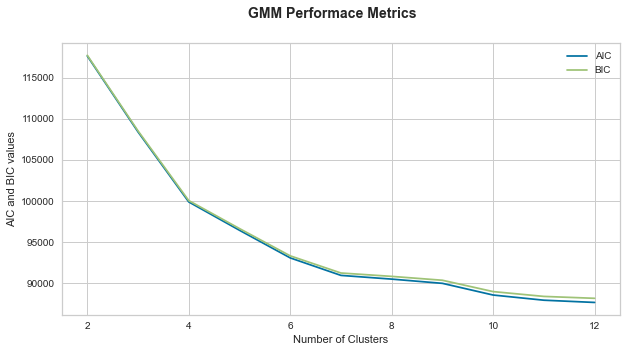

In [52]:
plt.figure(figsize=(10,5))
plt.suptitle('GMM Performace Metrics', fontsize=14, fontweight='bold')
sns.lineplot(x=gmm_scores_table.index, y=gmm_scores_table.AIC, label='AIC')
sns.lineplot(x=gmm_scores_table.index, y=gmm_scores_table.BIC, label='BIC')
plt.ylabel('AIC and BIC values')
plt.xlabel('Number of Clusters')
plt.legend(loc='best');

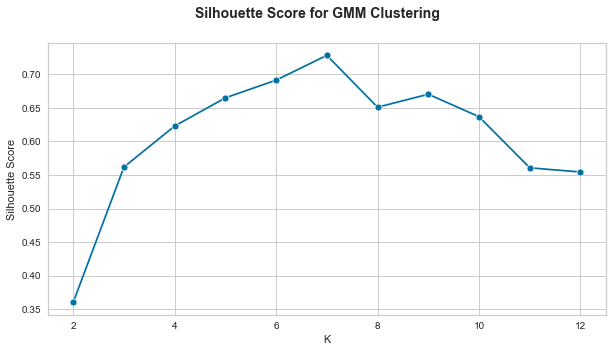

In [53]:
plt.figure(figsize=(10,5))
plt.suptitle('Silhouette Score for GMM Clustering', fontsize=14, fontweight='bold')
sns.lineplot(x=gmm_scores_table.index, y=gmm_scores_table['SS'], marker='o')
plt.xlabel('K');
plt.ylabel('Silhouette Score');

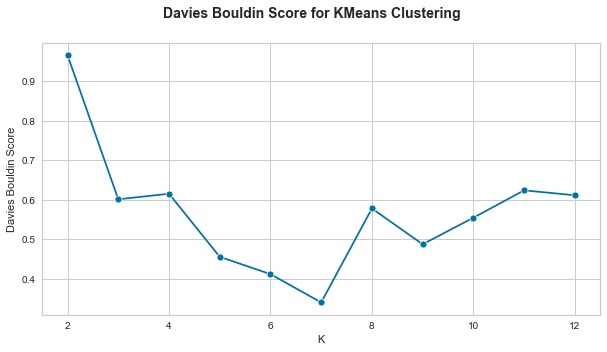

In [54]:
plt.figure(figsize=(10,5))
plt.suptitle('Davies Bouldin Score for KMeans Clustering', fontsize=14, fontweight='bold')
sns.lineplot(x=gmm_scores_table.index, y=gmm_scores_table['Davies Bouldin Score'], marker='o')
plt.xlabel('K');
plt.ylabel('Davies Bouldin Score');

In [55]:
k=7
gmm = GaussianMixture(n_components=k, random_state=RANDOM_SEED)#n_init=5, init_params='k-means++',
gmm_labels = gmm.fit_predict(umap_embedding)
clusters['GMM'] = gmm_labels

In [56]:
plot_graph2D(clusters['umap_x'],
             clusters['umap_y'],
             clusters['GMM'],
             title='GMM Cluster using UMAP')

## Best Model

In [57]:
cluster_results = clusters.copy()

In [58]:
cluster_results = pd.concat([clusters[['GMM']], data_new],axis=1)
cluster_results

,GMM,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,PROFIT,LIMIT_EXCEED
0,2.0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0.0,2.0,1000.0,201.802084,139.509787,0.000000,12.0,106.402084,0
1,1.0,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4.0,0.0,7000.0,4103.032597,1072.340217,0.222222,12.0,4103.032597,0
2,0.0,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0.0,12.0,7500.0,622.066742,627.284787,0.000000,12.0,-151.103258,0
3,6.0,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1.0,1.0,7500.0,0.000000,379.829982,0.000000,12.0,-1499.000000,0
4,0.0,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0.0,1.0,1200.0,678.334763,244.791237,0.000000,12.0,662.334763,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,2.0,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,325.594462,48.886365,0.500000,6.0,34.474462,0
8946,2.0,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0.0,6.0,1000.0,275.861322,156.060050,0.000000,6.0,-24.138678,0
8947,2.0,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0.0,5.0,1000.0,81.270775,82.418369,0.250000,6.0,-63.129225,0
8948,1.0,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2.0,0.0,500.0,52.549959,55.755628,0.250000,6.0,52.549959,0


In [59]:
def summary_stats(df):
    # central tendency: mean, median  
    numerical_features = data_prep.select_dtypes(include = ['int64','float64']).columns.values
    df = df[numerical_features]
    
    count_ = pd.DataFrame(df.apply(np.size))
    pct_ = pd.DataFrame(df.apply(np.size)/len(data_new)*100)
    sum_ = pd.DataFrame(df.apply(np.sum))
    mean_ = pd.DataFrame(df.apply(np.mean))
    std_ = pd.DataFrame(df.apply(np.std))
    median_ = pd.DataFrame(df.apply(np.median))
    
    min_ = pd.DataFrame(df.apply(min))
    max_ = pd.DataFrame(df.apply(max))
    range_ = pd.DataFrame(df.apply(lambda x: x.max() - x.min()))
    q1_ = pd.DataFrame(df.apply(lambda x: np.percentile(x,25)))
    q3_ = pd.DataFrame(df.apply(lambda x: np.percentile(x,75)))
    
    #skewness_= pd.DataFrame(df.apply(lambda x: x.skew()))
    #kurtosis_ = pd.DataFrame(df.apply(lambda x: x.kurtosis()))
    
    summary = pd.concat([count_, pct_, mean_, std_, median_, sum_, min_, max_, range_, q1_,q3_],axis=1)
    summary.columns = ['counts', '%','mean','std','median','sum','min','max', 'range', '25%','75%']
 

    cm = sns.light_palette("#2D7DAB", as_cmap = True)
    
    display(summary.style.format('{:.2f}').background_gradient(subset=(summary.index[1:],summary.columns[:]),cmap=cm))

In [60]:
summary_stats(cluster_results.loc[(cluster_results.GMM==0)])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,1086.00,12.13,752.34,1174.46,233.06,817039.39,0.00,12323.85,12323.85,43.34,1060.21
BALANCE_FREQUENCY,1086.00,12.13,0.77,0.30,1.00,832.56,0.00,1.00,1.00,0.55,1.00
PURCHASES,1086.00,12.13,840.46,1206.97,435.94,912743.45,0.01,9661.37,9661.36,151.41,1016.08
ONEOFF_PURCHASES,1086.00,12.13,840.00,1207.21,435.94,912238.87,0.01,9661.37,9661.36,150.00,1016.08
INSTALLMENTS_PURCHASES,1086.00,12.13,0.55,6.35,0.00,598.51,0.00,113.32,113.32,0.00,0.00
CASH_ADVANCE,1086.00,12.13,0.50,9.77,0.00,547.45,0.00,292.92,292.92,0.00,0.00
PURCHASES_FREQUENCY,1086.00,12.13,0.35,0.31,0.25,384.93,0.08,1.00,0.92,0.08,0.50
ONEOFF_PURCHASES_FREQUENCY,1086.00,12.13,0.35,0.31,0.25,383.52,0.08,1.00,0.92,0.08,0.50
PURCHASES_INSTALLMENTS_FREQUENCY,1086.00,12.13,0.00,0.01,0.00,1.70,0.00,0.17,0.17,0.00,0.00
CASH_ADVANCE_FREQUENCY,1086.00,12.13,0.00,0.01,0.00,0.56,0.00,0.14,0.14,0.00,0.00


In [61]:
summary_stats(cluster_results.loc[cluster_results.GMM==1])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,2053.00,22.94,2141.97,2100.38,1452.44,4397465.96,0.00,14224.12,14224.12,738.99,2837.11
BALANCE_FREQUENCY,2053.00,22.94,0.88,0.23,1.00,1809.75,0.00,1.00,1.00,0.90,1.00
PURCHASES,2053.00,22.94,0.03,0.75,0.00,59.02,0.00,27.79,27.79,0.00,0.00
ONEOFF_PURCHASES,2053.00,22.94,0.03,0.73,0.00,51.76,0.00,27.79,27.79,0.00,0.00
INSTALLMENTS_PURCHASES,2053.00,22.94,0.05,1.55,0.00,94.21,0.00,66.95,66.95,0.00,0.00
CASH_ADVANCE,2053.00,22.94,1981.53,2426.67,1202.33,4068090.32,18.04,26194.05,26176.01,380.85,2705.09
PURCHASES_FREQUENCY,2053.00,22.94,0.00,0.01,0.00,1.09,0.00,0.17,0.17,0.00,0.00
ONEOFF_PURCHASES_FREQUENCY,2053.00,22.94,0.00,0.01,0.00,0.92,0.00,0.17,0.17,0.00,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,2053.00,22.94,0.00,0.01,0.00,0.42,0.00,0.17,0.17,0.00,0.00
CASH_ADVANCE_FREQUENCY,2053.00,22.94,0.27,0.20,0.25,558.36,0.08,1.50,1.42,0.09,0.33


In [62]:
summary_stats(cluster_results.loc[cluster_results.GMM==2])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,1812.00,20.25,391.57,895.10,55.31,709518.57,0.00,11670.18,11670.18,18.11,285.11
BALANCE_FREQUENCY,1812.00,20.25,0.79,0.30,1.00,1423.04,0.00,1.00,1.00,0.64,1.00
PURCHASES,1812.00,20.25,524.60,819.24,320.49,950576.47,0.00,22500.00,22500.00,154.97,599.23
ONEOFF_PURCHASES,1812.00,20.25,0.21,3.27,0.00,372.30,0.00,69.90,69.90,0.00,0.00
INSTALLMENTS_PURCHASES,1812.00,20.25,525.40,821.48,320.68,952020.24,0.00,22500.00,22500.00,154.81,600.46
CASH_ADVANCE,1812.00,20.25,0.09,3.98,0.00,169.36,0.00,169.36,169.36,0.00,0.00
PURCHASES_FREQUENCY,1812.00,20.25,0.70,0.31,0.83,1276.76,0.08,1.00,0.92,0.42,1.00
ONEOFF_PURCHASES_FREQUENCY,1812.00,20.25,0.00,0.01,0.00,1.38,0.00,0.17,0.17,0.00,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,1812.00,20.25,0.67,0.31,0.75,1215.09,0.00,1.00,1.00,0.42,1.00
CASH_ADVANCE_FREQUENCY,1812.00,20.25,0.00,0.00,0.00,0.08,0.00,0.08,0.08,0.00,0.00


In [63]:
summary_stats(cluster_results.loc[cluster_results.GMM==3])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,961.00,10.74,2683.36,2359.60,1969.41,2578713.19,12.42,16115.60,16103.17,894.08,3846.50
BALANCE_FREQUENCY,961.00,10.74,0.97,0.08,1.00,934.71,0.36,1.00,0.64,1.00,1.00
PURCHASES,961.00,10.74,1697.59,1548.37,1199.77,1631380.69,64.82,10755.68,10690.86,592.82,2255.10
ONEOFF_PURCHASES,961.00,10.74,1009.59,1213.12,577.83,970216.20,8.90,9536.28,9527.38,223.38,1326.00
INSTALLMENTS_PURCHASES,961.00,10.74,688.02,738.35,433.00,661186.71,9.65,5059.29,5049.64,183.00,960.00
CASH_ADVANCE,961.00,10.74,1855.59,2190.71,1088.14,1783224.66,14.22,26268.70,26254.48,392.36,2525.74
PURCHASES_FREQUENCY,961.00,10.74,0.78,0.25,0.83,745.86,0.08,1.00,0.92,0.58,1.00
ONEOFF_PURCHASES_FREQUENCY,961.00,10.74,0.39,0.28,0.33,370.47,0.08,1.00,0.92,0.17,0.58
PURCHASES_INSTALLMENTS_FREQUENCY,961.00,10.74,0.63,0.31,0.67,601.90,0.08,1.00,0.92,0.38,0.92
CASH_ADVANCE_FREQUENCY,961.00,10.74,0.28,0.20,0.25,272.78,0.08,1.00,0.92,0.08,0.42


In [64]:
summary_stats(cluster_results.loc[cluster_results.GMM==4])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,1697.00,18.96,1149.04,1642.96,515.90,1949913.83,0.00,18495.56,18495.56,165.72,1487.52
BALANCE_FREQUENCY,1697.00,18.96,0.94,0.15,1.00,1589.16,0.00,1.00,1.00,1.00,1.00
PURCHASES,1697.00,18.96,2105.29,1948.65,1503.26,3572670.52,41.40,12465.21,12423.81,740.11,2761.41
ONEOFF_PURCHASES,1697.00,18.96,1237.74,1468.73,750.00,2100440.44,5.00,10929.53,10924.53,270.00,1669.80
INSTALLMENTS_PURCHASES,1697.00,18.96,867.58,1007.33,532.74,1472279.08,7.67,9251.65,9243.98,229.17,1129.34
CASH_ADVANCE,1697.00,18.96,0.27,7.23,0.00,461.09,0.00,231.72,231.72,0.00,0.00
PURCHASES_FREQUENCY,1697.00,18.96,0.81,0.24,0.92,1380.23,0.08,1.00,0.92,0.67,1.00
ONEOFF_PURCHASES_FREQUENCY,1697.00,18.96,0.46,0.33,0.33,772.17,0.08,1.00,0.92,0.17,0.75
PURCHASES_INSTALLMENTS_FREQUENCY,1697.00,18.96,0.65,0.31,0.67,1096.97,0.08,1.00,0.92,0.42,1.00
CASH_ADVANCE_FREQUENCY,1697.00,18.96,0.00,0.00,0.00,0.29,0.00,0.12,0.12,0.00,0.00


In [65]:
summary_stats(cluster_results.loc[cluster_results.GMM==5])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,458.00,5.12,2527.38,2483.34,1629.79,1157539.86,3.75,15532.34,15528.59,884.06,3326.50
BALANCE_FREQUENCY,458.00,5.12,0.96,0.12,1.00,438.95,0.18,1.00,0.82,1.00,1.00
PURCHASES,458.00,5.12,503.52,528.37,335.84,230613.74,4.44,4059.93,4055.49,158.21,623.02
ONEOFF_PURCHASES,458.00,5.12,0.00,0.07,0.00,2.03,0.00,1.00,1.00,0.00,0.00
INSTALLMENTS_PURCHASES,458.00,5.12,504.17,528.27,336.00,230910.50,4.44,4059.93,4055.49,158.21,623.02
CASH_ADVANCE,458.00,5.12,2014.42,2444.39,1133.90,922605.67,18.53,19862.88,19844.35,513.21,2634.02
PURCHASES_FREQUENCY,458.00,5.12,0.65,0.31,0.68,299.06,0.08,1.00,0.92,0.34,1.00
ONEOFF_PURCHASES_FREQUENCY,458.00,5.12,0.00,0.01,0.00,0.42,0.00,0.17,0.17,0.00,0.00
PURCHASES_INSTALLMENTS_FREQUENCY,458.00,5.12,0.61,0.31,0.67,277.12,0.08,1.00,0.92,0.33,0.91
CASH_ADVANCE_FREQUENCY,458.00,5.12,0.26,0.20,0.17,119.51,0.08,1.00,0.92,0.08,0.33


In [66]:
summary_stats(cluster_results.loc[cluster_results.GMM==6])

,counts,%,mean,std,median,sum,min,max,range,25%,75%
BALANCE,793.00,8.86,2323.53,2240.55,1601.39,1842558.45,1.60,15258.23,15256.63,816.82,3114.99
BALANCE_FREQUENCY,793.00,8.86,0.93,0.16,1.00,736.28,0.09,1.00,0.91,1.00,1.00
PURCHASES,793.00,8.86,592.70,957.08,298.49,470009.02,8.40,14215.00,14206.60,117.32,720.60
ONEOFF_PURCHASES,793.00,8.86,591.89,956.64,298.49,469366.41,8.40,14215.00,14206.60,117.32,720.16
INSTALLMENTS_PURCHASES,793.00,8.86,1.21,15.24,0.00,962.28,0.00,317.49,317.49,0.00,0.00
CASH_ADVANCE,793.00,8.86,1974.95,2353.83,1141.78,1566138.63,18.43,20277.33,20258.90,366.69,2734.18
PURCHASES_FREQUENCY,793.00,8.86,0.28,0.25,0.17,219.80,0.08,1.00,0.92,0.08,0.33
ONEOFF_PURCHASES_FREQUENCY,793.00,8.86,0.28,0.25,0.17,218.99,0.08,1.00,0.92,0.08,0.33
PURCHASES_INSTALLMENTS_FREQUENCY,793.00,8.86,0.00,0.02,0.00,1.64,0.00,0.33,0.33,0.00,0.00
CASH_ADVANCE_FREQUENCY,793.00,8.86,0.29,0.21,0.25,233.29,0.08,1.25,1.17,0.14,0.42


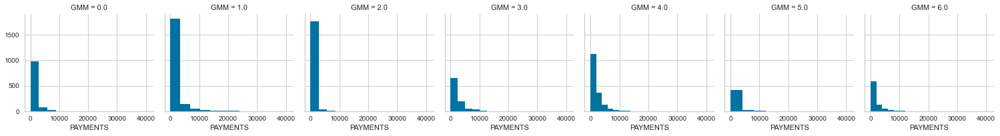

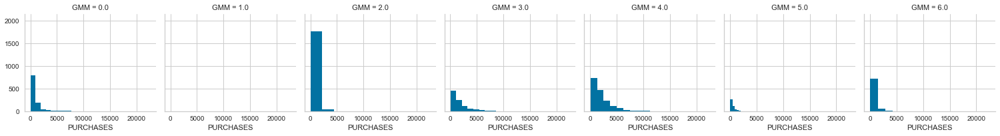

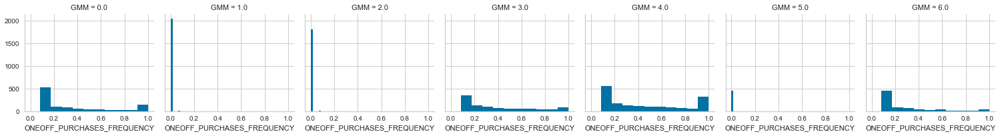

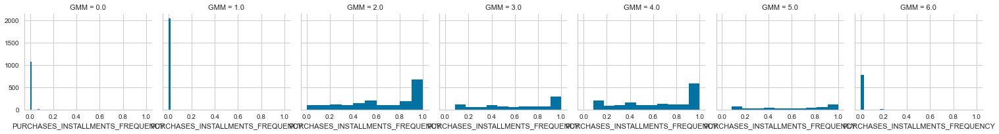

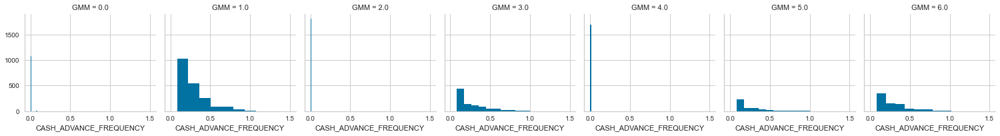

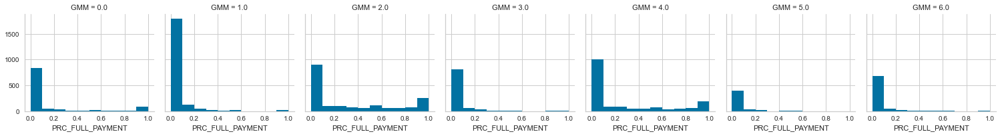

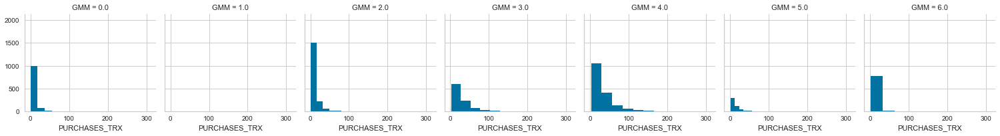

In [68]:
for c in cluster_results[['PAYMENTS','PURCHASES','ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY','PURCHASES_TRX']]:
    grid= sns.FacetGrid(cluster_results, col='GMM')
    grid.map(plt.hist, c)

C:\Users\Alysson\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

40.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\Alysson\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

48.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\Alysson\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

70.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\Alysson\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\Alysson\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning:

44.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.

C:\Users\Alysson\anaconda3\lib\

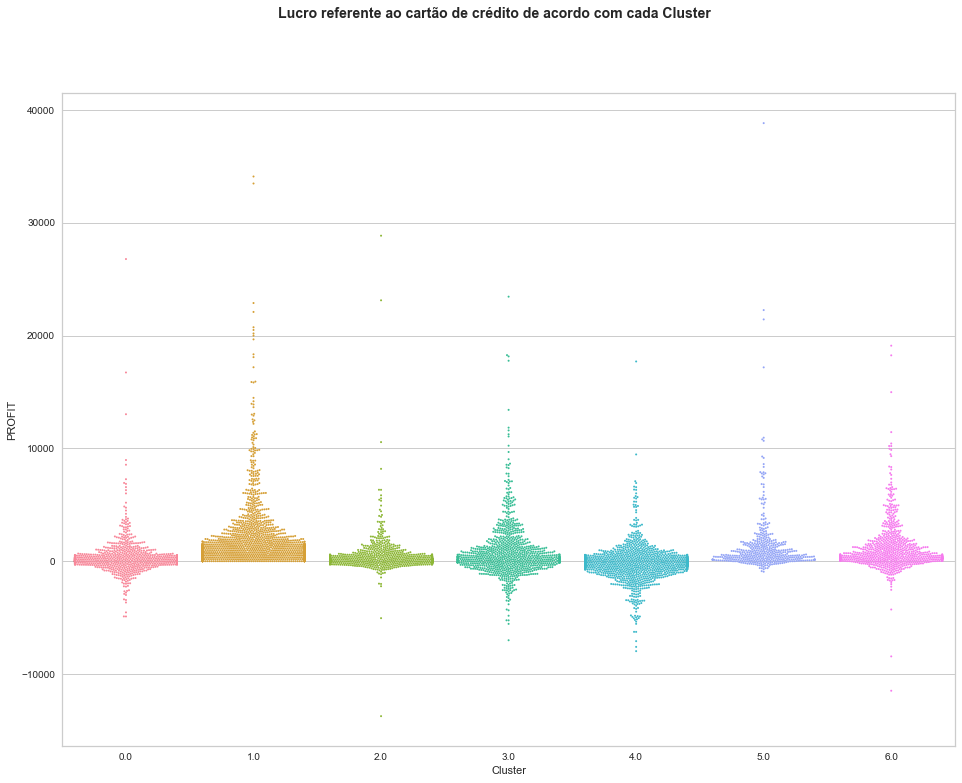

In [71]:
plt.figure(figsize=(16,12))
plt.suptitle('Lucro referente ao cartão de crédito de acordo com cada Cluster', fontsize=14, fontweight='bold')
sns.swarmplot(data=cluster_results, x="GMM", y="PROFIT", size=2)
plt.xlabel('Cluster');

# Conclusões

O modelo GMM apresentou bons resultados no que diz respeito a separação dos clusters e siginificativos para o problema de négocio. Identificando os clientes que mais compram com cartão de crédito de acordo com a modalidade, os clientes mais lucrativos, os clientes que possuem mais saldo disponível, etc.

Comentando um pouco mais sobre as técnicas utilizadas, a redução da dimensionalidade através do PCA e UMAP melhoraram consideravelmente o Silhouette Score e Davies Bouldin Score, já o tratamento de outliers teve pouco peso nessas métricas. 

O projeto foi entregue no prazo estipulado, com todas as etapas concluídas, o que foi um desafio a parte.